In [2]:
import matplotlib.pyplot as plt
%matplotlib inline
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
tf.disable_eager_execution()
import numpy as np
import time
import os
import math
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import InputLayer, Input
from tensorflow.python.keras.layers import Reshape, MaxPooling2D
from tensorflow.python.keras.layers import Conv2D, Dense, Flatten
from tensorflow.python.keras import backend as K

Instructions for updating:
non-resource variables are not supported in the long term


## Load Data

The CIFAR-10 data-set is about 163 MB and will be downloaded if it is not already located in the  datasets path (~/.keras/datasets/).

In [3]:
from tensorflow.python.keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data() #load dataset into ~/.keras/datasets/

#printout shapes of train and test data
print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)

(50000, 32, 32, 3) (50000, 1)
(10000, 32, 32, 3) (10000, 1)


__Q: How many traning and test examples are there? What shape is each image in the datset? How many different classes are there?__

In [4]:
#YOUR CODE/ANSWER HERE
# N_train = 
# N_test = 
# img_shape =             #use a tuple in the fomat: (height, width, n_channels)
# n_classes = 

# print(N_train,N_test,img_shape,n_classes)

#ANSWER
N_train = x_train.shape[0]
N_test = x_train.shape[0]
img_shape = x_train.shape[1:]# (height, width, n_channels)
n_classes = len(np.unique(y_train))
print(N_train,N_test,img_shape,n_classes)

50000 50000 (32, 32, 3) 10


__Q: Plot the first 5 training examples of each class as subplots in an__`n_classes` __-by-5 grid. Name each class and put your class names in a list__ `class_names`__.__

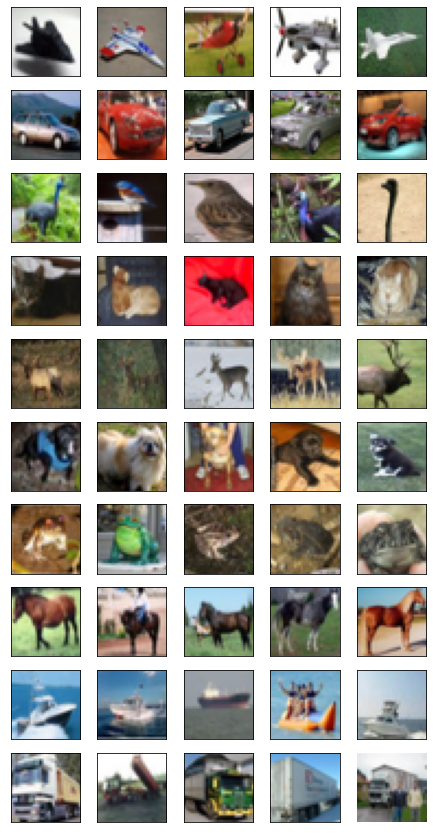

In [5]:
#YOUR CODE/ANSWER HERE
# 
# class_names =
# print (class_names)

#ANSWER
f, axes = plt.subplots(n_classes,5,figsize=(5*1.5,n_classes*1.5))
plt.axis('off')
for c in range(n_classes):
    class_examples = x_train[(y_train==c).ravel()]
    for i in range(5):
        ax = axes[c,i]
        ax.imshow(class_examples[i])
        ax.set_xticks([]); ax.set_yticks([])
        
class_names = ['airplane','automobile','bird','cat','deer','dog','frog','horse','ship','truck']

__Now convert the class numbers in__ `y_train` __and__ `y_test` __into one-hot encoded arrays. Use the function__ `tf.keras.utils.to_categorical`__.__

*Hint:* run `?tf.keras.utils.to_categorical` in a separate notebook cell to open up the docs for this function, or simply hit `shift+tab` twice once your cursor is inside the parentheses in `tf.keras.utils.to_categorical(...)`.

In [6]:
#YOUR CODE/ANSWER HERE
#y_train =
#y_test =
y_train_class_labels = y_train
y_train = tf.keras.utils.to_categorical(y_train)
y_test = tf.keras.utils.to_categorical(y_test)

## Define the model:

Now you will start building your network model. We will use the Sequential Model class for that. More info [here](https://keras.io/getting-started/sequential-model-guide/).

In [7]:
# Start construction of the Keras Sequential model.
model = Sequential()

# Input layer for setting the shape of the input images
model.add(InputLayer(input_shape=img_shape,))

# First convolutional layer with ReLU-activation and max-pooling.
model.add(Conv2D(kernel_size=5, strides=1, filters=64, padding='same',
                 activation='relu', name='layer_conv1'))
model.add(MaxPooling2D(pool_size=2, strides=2))

# Second convolutional layer with ReLU-activation and max-pooling.
model.add(Conv2D(kernel_size=5, strides=1, filters=64, padding='same',
                 activation='relu', name='layer_conv2'))
model.add(MaxPooling2D(pool_size=2, strides=2))

# Flatten the 4-rank output of the convolutional layers
# to 2-rank that can be input to a fully-connected / dense layer.
model.add(Flatten())

# First fully-connected / dense layer with ReLU-activation.
model.add(Dense(256, activation='relu'))
# Second fully-connected / dense layer with ReLU-activation.
model.add(Dense(128, activation='relu'))

# Last fully-connected / dense layer with softmax-activation
# for use in classification.
model.add(Dense(n_classes, activation='softmax'))

In [8]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
layer_conv1 (Conv2D)         (None, 32, 32, 64)        4864      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 16, 16, 64)        0         
_________________________________________________________________
layer_conv2 (Conv2D)         (None, 16, 16, 64)        102464    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 8, 8, 64)          0         
_________________________________________________________________
flatten (Flatten)            (None, 4096)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               1048832   
_________________________________________________________________
dense_1 (Dense)              (None, 128)               3

Learn more about Adam and other gradient descent-based methods here:
    http://ruder.io/optimizing-gradient-descent/index.html

In [9]:
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate = 1e-4) #lr sets the learning rate (default: .001)

The next step is compiling your model using the optimizer chosen above. You should set the loss function to be used, together with any metrics you might want computed after each training step. More info on metrics [here](https://keras.io/metrics/).

In [10]:
model.compile(optimizer=optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

## Functions to generate the embedding:

In [11]:
def apply_all_shifts(im, shift_step):
    '''
    arg(s): 
        im, an image of shape (im_size, im_size, 3)
    return: 
        im_all_shifts, a list of all shifted images from the input image
        n_shifts, number of shifted images
    '''
    
    ## vertical size might not be the same as the horizontal
    im_size_vertical = im.shape[0]
    im_size_horizontal = im.shape[1]
    
    n_shifts_vertical = int(math.ceil(im_size_vertical/ shift_step))
    n_shifts_horizontal = int(math.ceil(im_size_horizontal/ shift_step))
    
    im_all_shifts = []
    im_shift = im
    for i in range(n_shifts_vertical):
        im_shift = np.roll(im_shift, shift = shift_step * i, axis=0)
        
        for j in range(n_shifts_horizontal):
            im_shift = np.roll(im_shift, shift = shift_step * j, axis=1)
            im_all_shifts.append(im_shift)
            
    im_all_shifts =  np.array(im_all_shifts)
    return im_all_shifts, n_shifts_vertical * n_shifts_horizontal

In [12]:
 def compute_neuron_output_alt(layer_indices, images, plot_activity = False):

    '''
    arg(s):
        layer_indices: list of the indices of the layers we want to take neuron outputs from
        images: an array of images (stimuli)
    return:
        
    '''
    n_layers = len(layer_indices)
    neuron_output_highest = []
    all_fm_avg = []
    neuron_labels = []
    
    for layer_index in layer_indices:
        layer = model.layers[layer_index] 
#         print(layer.name)
        # check for convolutional layer
        if 'conv' not in layer.name:
            continue
        ## note: always take the images as inputs
        output_layer = K.function(inputs=[model.layers[0].input], 
                              outputs=[layer.output])
        
        ## output is n feature maps
        neuron_output = output_layer(images)[0]
   
        ## number of neurons is nrow * ncol * n_feature_maps
        n_images, n_row, n_col, n_feature_maps = neuron_output.shape[:]
        n_neurons = n_row * n_col
#         print(n_neurons)
        neuron_output = neuron_output.reshape((n_images, n_neurons, n_feature_maps))
    
        
        ## transpose to organize by feature maps
        ## neuron_output_by_fm is (n_images, n_feature_maps, #neurons)
        neuron_output_by_fm = np.transpose(neuron_output, (0, 2, 1)) 
        
        ## compute avg neuron firing rate in each feature map
        ## fm_avg is (n_images, n_feature_maps)
        fm_avg = neuron_output_by_fm.sum(axis=2) / neuron_output_by_fm.shape[2]
        
#         print(layer_index)
        if layer_index == 0:
            fm_avg_all_layers = fm_avg
            neuron_output_by_fm_all_layers = neuron_output_by_fm
        else:
            fm_avg_all_layers = np.hstack((fm_avg_all_layers, fm_avg))
#             print(neuron_output_by_fm_all_layers.shape)
#             print(neuron_output_by_fm.shape)
            neuron_output_by_fm_all_layers = np.concatenate((neuron_output_by_fm_all_layers,neuron_output_by_fm), axis = 1)

    neuron_output_highest = np.empty((n_images,n_neurons *10))
    for i in range(n_images):
        max10_indices = np.argpartition(fm_avg_all_layers[i], -10, axis = 0)[-10:]
        neuron_output_highest[i] = neuron_output_by_fm_all_layers[i, max10_indices, :].reshape((1,n_neurons *10))
       
    
    for i in range(10):    
        neuron_labels += [i] * n_neurons
        
    neuron_labels = np.array(neuron_labels)     
    return neuron_output_highest, fm_avg_all_layers, neuron_labels 

In [13]:
def show_stimuli(layer_indices, n_images_per_class, image_classes, shifts, plot_activity = False):
    '''
    arg(s): 
        layer_indices
        n_images_per_class
        image_classes
        shifts = True/False
    return:
        neuron_output_shifts_avg, (n_images, n_neurons)
    '''
    # select images from specified classes:
    
    n_classes = len(image_classes)
    n_images = n_classes * n_images_per_class
    
    for i in range(n_classes):
        
        idx = (y_train_class_labels == image_classes[i]).reshape(x_train.shape[0])
        images = x_train[idx]
        
        ## images has shape (5000, 32, 32, 3), take the first n_images_per_class images from each selected class:
        images = images[0:n_images_per_class,:,:,:]
        
        if i == 0:
            images_selected_classes = images
        else:
            images_selected_classes = np.vstack((images_selected_classes, images))
    
    images_selected_classes = np.array(images_selected_classes)
    
    if shifts is False:
        neuron_output_highest, fm_avg_all_layers, neuron_labels = compute_neuron_output_alt(layer_indices, images_selected_classes, plot_activity = plot_activity)
    
    else:
        # generate shifts for each selected image: 
        neuron_output_highest_with_shifts = []
        fm_avg_all_layers_with_shifts = []
        for i in range(n_images):
            im = images_selected_classes[i]
            im_all_shifts, n_shifts =  apply_all_shifts(im, 1)

            neuron_output_highest, fm_avg_all_layers, neuron_labels = compute_neuron_output_alt(layer_indices, im_all_shifts, plot_activity = False)
            ## neuron_output_highest is of shape (number of shifts, neurons)

            ## take the average over all shifts of im
            shifts_avg = neuron_output_highest.sum(axis=0) / neuron_output_highest.shape[0]
            shifts_avg = shifts_avg.reshape((1,shifts_avg.shape[0]))
            
            fm_shifts_avg = fm_avg_all_layers.sum(axis=0) / fm_avg_all_layers.shape[0]
            fm_shifts_avg = fm_shifts_avg.reshape((1,fm_shifts_avg.shape[0]))
            
            if i == 0:
                neuron_output_highest_with_shifts = shifts_avg 
                fm_avg_all_layers_with_shifts = fm_shifts_avg
            else:
                neuron_output_highest_with_shifts = np.vstack((neuron_output_highest_with_shifts, shifts_avg))
                fm_avg_all_layers_with_shifts = np.vstack((fm_avg_all_layers_with_shifts, fm_shifts_avg))
                
        neuron_output_highest = neuron_output_highest_with_shifts
        fm_avg_all_layers = fm_avg_all_layers_with_shifts
 
    return neuron_output_highest, fm_avg_all_layers, neuron_labels

In [14]:
def generate_embedding():
    neuron_output_highest_with_shifts, fm_avg_all_layers_with_shifts, neuron_labels= show_stimuli(layer_indices = [0,1], n_images_per_class = 10, image_classes = [3,1,0,5], shifts = True)
    from sklearn.decomposition import PCA
    pca = PCA(10)
    neuron_output_highest_with_shifts_projected = pca.fit_transform(neuron_output_highest_with_shifts.T)
    neuron_output_highest_with_shifts_projected.shape
    import plotly.graph_objects as go
    import plotly.express as px

    fig = go.Figure()
    traces = []
    colors_palette = px.colors.qualitative.Dark24
    data = neuron_output_highest_with_shifts_projected

    for i, label in enumerate(set(neuron_labels)):
        mask = (neuron_labels == label)
        print(label, sum(mask))
        traces.append(go.Scatter3d(
            x=data[mask,0],
            y=data[mask,1],
            z=data[mask,2],
            mode='markers',
            marker=dict(
                size=4,
                color=colors_palette[i],
                opacity=1,

                #showscale= True,
            )))

    for trace in traces:
        fig.add_trace(trace)

    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0),showlegend=True,)
    fig.show()

Believe it or not, after these simple and intuitive steps, your network model is ready to be trained! Use the `fit` method, passing the inputs `x`, desired outputs `y`, and setting the number of `epochs` and `batch_size`. (Be careful: if you choose too large a batch size, your machine might get really slow if it runs short of RAM -- if that happens, simply choose smaller batches.)


In [15]:
model.fit(x=x_train,
          y=y_train,
          epochs=1, batch_size=100)

Train on 50000 samples
50000/50000 [==============================] - 51s 1ms/sample - loss: 2.5482 - acc: 0.3260


In [16]:
import plotly.graph_objects as go
import plotly.express as px

fig = go.Figure()
traces = []
colors_palette = px.colors.qualitative.Dark24
data = neuron_output_highest_with_shifts_projected

for i, label in enumerate(set(neuron_labels)):
    mask = (neuron_labels == label)
    print(label, sum(mask))
    traces.append(go.Scatter3d(
        x=data[mask,0],
        y=data[mask,1],
        z=data[mask,2],
        mode='markers',
        marker=dict(
            size=4,
            color=colors_palette[i],
            opacity=1,

            #showscale= True,
        )))

for trace in traces:
    fig.add_trace(trace)

fig.update_layout(margin=dict(l=0, r=0, b=0, t=0),showlegend=True,)
fig.show()


# Create figure
fig = go.Figure(
    data=[go.Scatter3d(x=[], y=[], z=[],
                     mode="markers",marker=dict(color="red", size=10))])
    
fig.update_layout(
        
         scene = dict(
        
        xaxis=dict(range=[min(x), max(x)], autorange=False),
        yaxis=dict(range=[min(y), max(y)], autorange=False),
        zaxis=dict(range=[min(z), max(z)], autorange=False),
        )),


frames = [go.Frame(data= [go.Scatter3d(
                                       x=x[[k]], 
                                       y=y[[k]],
                                       z=z[[k]])],
                   
                   traces= [0],
                   name=f'frame{k}'      
                  )for k  in  range(len(x))]
fig.update(frames=frames),




fig.update_layout(updatemenus=[dict(type="buttons",
                          buttons=[dict(label="Play",
                                        method="animate",
                                        args=[None, dict(frame=dict(redraw=True,fromcurrent=True, mode='immediate'))      ])])])


fig.show()

0 1024
1 1024
2 1024
3 1024
4 1024
5 1024
6 1024
7 1024
8 1024
9 1024


In [57]:
model.fit(x=x_train,
          y=y_train,
          epochs=5, batch_size=100)

Train on 50000 samples
Epoch 1/5
50000/50000 [==============================] - 55s 1ms/sample - loss: 1.4452 - acc: 0.4896
Epoch 2/5
50000/50000 [==============================] - 56s 1ms/sample - loss: 1.2400 - acc: 0.5620
Epoch 3/5
50000/50000 [==============================] - 54s 1ms/sample - loss: 1.0953 - acc: 0.6141
Epoch 4/5
50000/50000 [==============================] - 55s 1ms/sample - loss: 0.9799 - acc: 0.6553
Epoch 5/5
50000/50000 [==============================] - 55s 1ms/sample - loss: 0.8726 - acc: 0.6962


In [59]:
generate_embedding()

0 1024
1 1024
2 1024
3 1024
4 1024
5 1024
6 1024
7 1024
8 1024
9 1024


In [60]:
model.fit(x=x_train,
          y=y_train,
          epochs=5, batch_size=100)

Train on 50000 samples
Epoch 1/5
50000/50000 [==============================] - 54s 1ms/sample - loss: 0.7782 - acc: 0.7300
Epoch 2/5
50000/50000 [==============================] - 56s 1ms/sample - loss: 0.6931 - acc: 0.7615
Epoch 3/5
50000/50000 [==============================] - 55s 1ms/sample - loss: 0.6088 - acc: 0.7907
Epoch 4/5
50000/50000 [==============================] - 56s 1ms/sample - loss: 0.5223 - acc: 0.8220
Epoch 5/5
50000/50000 [==============================] - 52s 1ms/sample - loss: 0.4454 - acc: 0.8497


In [63]:
generate_embedding()

0 1024
1 1024
2 1024
3 1024
4 1024
5 1024
6 1024
7 1024
8 1024
9 1024


In [64]:
model.fit(x=x_train,
          y=y_train,
          epochs=5, batch_size=100)

Train on 50000 samples
Epoch 1/5
50000/50000 [==============================] - 57s 1ms/sample - loss: 0.3782 - acc: 0.8745
Epoch 2/5
50000/50000 [==============================] - 53s 1ms/sample - loss: 0.3098 - acc: 0.8985
Epoch 3/5
50000/50000 [==============================] - 53s 1ms/sample - loss: 0.2481 - acc: 0.9221
Epoch 4/5
50000/50000 [==============================] - 53s 1ms/sample - loss: 0.1910 - acc: 0.9417
Epoch 5/5
50000/50000 [==============================] - 53s 1ms/sample - loss: 0.1548 - acc: 0.9544


In [65]:
generate_embedding()

0 1024
1 1024
2 1024
3 1024
4 1024
5 1024
6 1024
7 1024
8 1024
9 1024


In [68]:
model.fit(x=x_train,
          y=y_train,
          epochs=10, batch_size=100)

Train on 50000 samples
Epoch 1/5
50000/50000 [==============================] - 56s 1ms/sample - loss: 0.0559 - acc: 0.9844
Epoch 2/5
50000/50000 [==============================] - 57s 1ms/sample - loss: 0.0461 - acc: 0.9872
Epoch 3/5
50000/50000 [==============================] - 56s 1ms/sample - loss: 0.0475 - acc: 0.9862
Epoch 4/5
50000/50000 [==============================] - 56s 1ms/sample - loss: 0.0407 - acc: 0.9883
Epoch 5/5
50000/50000 [==============================] - 55s 1ms/sample - loss: 0.0421 - acc: 0.9878


In [69]:
generate_embedding()

0 1024
1 1024
2 1024
3 1024
4 1024
5 1024
6 1024
7 1024
8 1024
9 1024


Another method available for the Sequential model class is `evaluate`. This runs your network in "test mode" without updating any weights (no backprop), while evaluating any metrics that have been set for the model.

In [70]:
result = model.evaluate(x=x_test,
                        y=y_test)
for name, value in zip(model.metrics_names, result):
    print(name, value)

C:\Users\ifisa\AppData\Roaming\Python\Python38\site-packages\tensorflow\python\keras\engine\training.py:2426: UserWarning:

`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.



loss 2.06635766620636
acc 0.6578


overfitting??

In [72]:
#This is how you save your model for later use. It will keep the current learned set of weights.
model_path = 'modelweights.keras'
model.save(model_path) #save the weights only -- 
# can reload them with model.load_weights(model_path) 

#This other option saves the entire model: layers + weights
from tensorflow.python.keras.models import save_model
model_path = 'fullmodel.keras'
save_model(model,model_path)

# (And this is how you load a previously saved model:)
# from tensorflow.python.keras.models import load_model
# model_path = 'fullmodel.keras'
# model = load_model(model_path)

Now let's take a look at what kinds of images the network wasn't able to correctly classify. we can use `predict` to get the network output for a given input set of images:

In [73]:
y_pred = model.predict(x=x_test)

C:\Users\ifisa\AppData\Roaming\Python\Python38\site-packages\tensorflow\python\keras\engine\training.py:2426: UserWarning:

`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.



__Q: Plot 16 examples of images in the test set that are incorrectly classified. Label them by their true class and the class predicted by the network (use your__ `class_names` __list for naming the classes!). Use subplots on a 4-by-4 grid.__

In [ ]:
# YOUR CODE HERE

### Visualization of Layer Weights and Outputs

In order to access the layers in your network, it might be helpful to print out a summary of your model.

In [12]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
layer_conv1 (Conv2D)         (None, 32, 32, 64)        4864      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 16, 16, 64)        0         
_________________________________________________________________
layer_conv2 (Conv2D)         (None, 16, 16, 64)        102464    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 8, 8, 64)          0         
_________________________________________________________________
flatten (Flatten)            (None, 4096)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               1048832   
_________________________________________________________________
dense_1 (Dense)              (None, 128)               32896     
__________

We count the indices to get the layers we want.
The first conv layer has index 0.

In [13]:
layer_conv1 = model.layers[0] 

The second convolutional layer has index 2.

In [14]:
layer_conv2 = model.layers[2] 

Once we have the layers, easily get to their current weights with `get_weights()`.

In [15]:
weights_conv1, bias_conv1 = layer_conv1.get_weights()

#alway check whether the shapes make sense!
weights_conv1.shape,bias_conv1.shape

((5, 5, 3, 64), (64,))

__Q: Do the same for the second conv layer now.__

In [16]:
# TODO
# weights_conv2, bias_conv2 =
weights_conv2, bias_conv2 = layer_conv2.get_weights()
weights_conv2.shape,bias_conv2.shape

((5, 5, 64, 64), (64,))

Note that the filters in the first conv layer have a non-unitary third dimension, due to the input images being color-images (3 channels: R,G,B). So, you can either plot each channel separately or combine the three into a color image: but you need to convert the values into integers within the range 0-255 (note that, for weights in the second layer, of course you only have the former option!).

In [1]:
w = weights_conv1[:,:,:,0]
#find min and max vals
min_w, max_w = w.min(), w.max()
#put into 0-1 range, then scale by 255 and cast to unsigned int
w = (255*(w - min_w / (max_w - min_w))).astype('uint8')
plt.imshow(w)

NameError: name 'weights_conv1' is not defined

__Q: Plot some of filters for the first and second conv layers.__

_(you can try setting `interpolation='gaussian'` in `imshow` to see if the appearance of the filters improve with a little blurring)_

In [ ]:
# YOUR CODE HERE


### Plotting the output of a convolutional layer

For this, we will use the `K` backend function which will create a function from a part of your Keras model. (It's actually less complicated than it sounds!)

In [18]:
from tensorflow.python.keras import backend as K

#since layer_conv1 is the first real layer in our model (index 0),
# the input to layer_conv1 are the actual input images
output_conv1 = K.function(inputs=[layer_conv1.input], 
                          outputs=[layer_conv1.output])

In [19]:
#pick an image from the test set to feed it to the network
im1 = x_test

#put the image inside a list since the layer expects a 4-d input tensor as input
out1 = output_conv1([ x_test ])[0] 
out1.shape

(1, 32, 32, 64)

In [4]:

#choose 8 filters


476288

In [ ]:
plt.imshow(out1[0,:,:,31],cmap='gray')

In [ ]:
out1[:,0,0,31]

__Q: Plot some outputs for the second conv layer.__

In [ ]:
# YOUR CODE HERE
output_conv2 = K.function(inputs=[layer_conv1.input], 
                          outputs=[layer_conv2.output])

out2 = output_conv2([ [im1] ])[0] 
out2.shape

### Compute maximally-activating images using Keras

The function below will compute max images in a very similar way to what was done in Q4, except now using the Keras backend. Make sure you understand it! We also use a separate function to convert the optimized input array into a reasonable image format.

In [38]:
img_shape

(32, 32, 3)

In [63]:
from tensorflow.python.keras import backend as K

def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    # (this trick helps to make it look like a "real" image)
    x -= x.mean()
    x /= (x.std() + K.epsilon())
    x *= 0.25

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    # make sure pixel values are in the correct range
    x = np.clip(x, 0, 255).astype('uint8')
    return x

def compute_max_image(input_img_placeholder,layer_output,
                      epochs=20,step=1.):
    loss = K.mean(layer_output)

    # compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, input_img_placeholder)[0]

    # normalization trick: normalizing the gradient with its root-mean-square
    # avoids very small and very large gradients and ensures a smooth gradient ascent process.
    grads /= (K.sqrt(K.mean(K.square(grads))) + K.epsilon()) #RMS

    # this function returns the loss and grads given the input picture
    iterate = K.function([input_img_placeholder], [loss, grads])
    
    # we start from a gray image with some noise
    input_img_data = (np.random.random((1, img_shape[0], img_shape[1], img_shape[2]))-.5).astype(np.float32) * 20 + 128.
    
    # run gradient ascent for e.g. 20 steps
    for _ in range(epochs):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step

    # decode the resulting input image          
    img = input_img_data[0]
    img = deprocess_image(img)
    return loss_value,img

In [76]:
#Let's generate some max images for layer_conv1

mylayer = layer_conv1

filt_indices = range(16)
res = []
for filter_index in filt_indices:
    print(filter_index,end=" ")

    layer_output = mylayer.output[:, :, :, filter_index]
    
    input_img = model.inputs[0]

    loss, img = compute_max_image(input_img,layer_output)
    print(" loss:",loss)
    res.append(img)
    

0  loss: 6.92875
1  loss: 4.0541463
2  loss: 8.962654
3  loss: 1.511368
4  loss: 17.587307
5  loss: 7.8959007
6  loss: 45.93347
7  loss: 19.451235
8  loss: 2.0906665
9  loss: 0.2779998
10  loss: 1.977242
11  loss: 2.4125059
12  loss: 47.42077
13  loss: 38.143593
14  loss: 0.0
15  loss: 12.303568


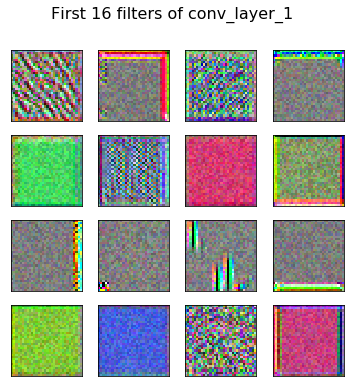

In [82]:
def plot_image_ax(image,ax):
    ax.imshow(image.reshape(img_shape),
               interpolation='nearest',
               cmap='gray')
r,c = 4,4
filt_indices = range(r*c)
f,axes = plt.subplots(r,c,figsize=(c*1.5,r*1.5))
f.subplots_adjust(wspace=.2,hspace=.2)
plt.suptitle('First 16 filters of conv_layer_1',size=16)
for ax_i,img in enumerate(res):
    ax = axes.ravel()[ax_i]
    plot_image_ax(img,ax)
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()  

__Q. Plot maximally-activating images for generated layer_conv1. Do the same for layer_conv2. (Remember, none of these are unique, so by running the code again you might get different examples, corresponding to reaching different local maxima with gradient ascent.)__

In [ ]:
# YOUR CODE HERE

## Finding an input that maximizes a specific class

__Q. Now generate maximal images for each class (optimize the final output of the network, as you did in Q4).__

In [ ]:
# YOUR CODE HERE

__Q. _OPTIONAL:_ This [post](https://blog.keras.io/how-convolutional-neural-networks-see-the-world.html) from the Keras blog shows a more sofisticated strategy for generating maximal images, where we start with a small image and slowly grow its dimensions until it reaches the actual size. Feel free to use their code and see if you get better images. A heads up: you will need to change the input_shape of your Input layer to allow for variable-sized images (simply use__ `None`__)__.

In [ ]:
# YOUR CODE HERE

In [61]:
classif_layer = model.layers[7]
mylayer = classif_layer
myoutput = mylayer.output
myoutput.shape

TensorShape([Dimension(None), Dimension(10)])

In [64]:
class_indices = range(10)
res = []
for class_index in class_indices:
    print(filter_index,end=" ")

    layer_output = myoutput[:, class_index]
    
    input_img = model.inputs[0]

    loss, img = compute_max_image(input_img,layer_output,filter_index)
    print(" loss:",loss)
    res.append(img)

15  loss: 0.9999801
15  loss: 0.99976856
15  loss: 0.9999801
15  loss: 0.99996364
15  loss: 0.99996734
15  loss: 0.9998431
15  loss: 0.9999728
15  loss: 0.9999366
15  loss: 0.99996746
15  loss: 0.9995492


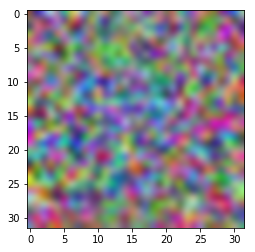

In [68]:
plt.imshow(res[1],interpolation='bicubic')

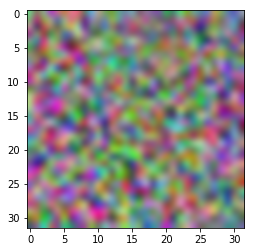

In [73]:
plt.imshow(res[6],interpolation='bicubic')

In [ ]:
# Start construction of the Keras Sequential model.
model = Sequential()

# Input layer for setting the shape of the input images
#model.add(InputLayer(input_shape=img_shape,))
model.add(InputLayer(input_shape=(None,None,3)))

# First convolutional layer with ReLU-activation and max-pooling.
model.add(Conv2D(kernel_size=5, strides=1, filters=64, padding='same',
                 activation='relu', name='layer_conv1'))
model.add(MaxPooling2D(pool_size=2, strides=2))

# Second convolutional layer with ReLU-activation and max-pooling.
model.add(Conv2D(kernel_size=5, strides=1, filters=64, padding='same',
                 activation='relu', name='layer_conv2'))
model.add(MaxPooling2D(pool_size=2, strides=2))

# Flatten the 4-rank output of the convolutional layers
# to 2-rank that can be input to a fully-connected / dense layer.
#model.add(Flatten())
model.add(GlobalAveragePooling2D())

# First fully-connected / dense layer with ReLU-activation.
model.add(Dense(256, activation='relu'))
# Second fully-connected / dense layer with ReLU-activation.
model.add(Dense(128, activation='relu'))

# Last fully-connected / dense layer with softmax-activation
# for use in classification.
model.add(Dense(n_classes, activation='softmax'))